In [5]:
import colorizers
import argparse
import matplotlib.pyplot as plt

from colorizers import *


colorizer_eccv16 = colorizers.eccv16().eval()
colorizer_siggraph17 = colorizers.siggraph17().eval()
# parser = argparse.ArgumentParser()
# parser.add_argument('-i','--img_path', type=str, default='imgs/ansel_adams3.jpg')
# parser.add_argument('--use_gpu', action='store_true', help='whether to use GPU')
# parser.add_argument('-o','--save_prefix', type=str, default='saved', help='will save into this file with {eccv16.png, siggraph17.png} suffixes')
# opt = parser.parse_args()

In [24]:
# if(opt.use_gpu):
colorizer_eccv16.cuda()
colorizer_siggraph17.cuda()

# default size to process images is 256x256
# grab L channel in both original ("orig") and resized ("rs") resolutions
img = load_img('imgs/ansel_adams.jpg')
(tens_l_orig, tens_l_rs) = preprocess_img(img, HW=(256,256))
# if(opt.use_gpu):
tens_l_rs = tens_l_rs.cuda()

# colorizer outputs 256x256 ab map
# resize and concatenate to original L channel
img_bw = postprocess_tens(tens_l_orig, torch.cat((0*tens_l_orig,0*tens_l_orig),dim=1))
out_img_eccv16 = postprocess_tens(tens_l_orig, colorizer_eccv16(tens_l_rs).cpu())
out_img_siggraph17 = postprocess_tens(tens_l_orig, colorizer_siggraph17(tens_l_rs).cpu())

In [25]:
# type(img)
# b = "abc"
# b[:-1]
# img.shape
# out_img_siggraph17.shape
# tens_l_rs
# out_img_siggraph17
from PIL import Image
import cv2

norm_out_img = cv2.normalize(out_img_siggraph17, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
norm_out_img = norm_out_img.astype(np.uint8)

colorized_img = Image.fromarray(norm_out_img,'RGB')

In [28]:
# colorized_img

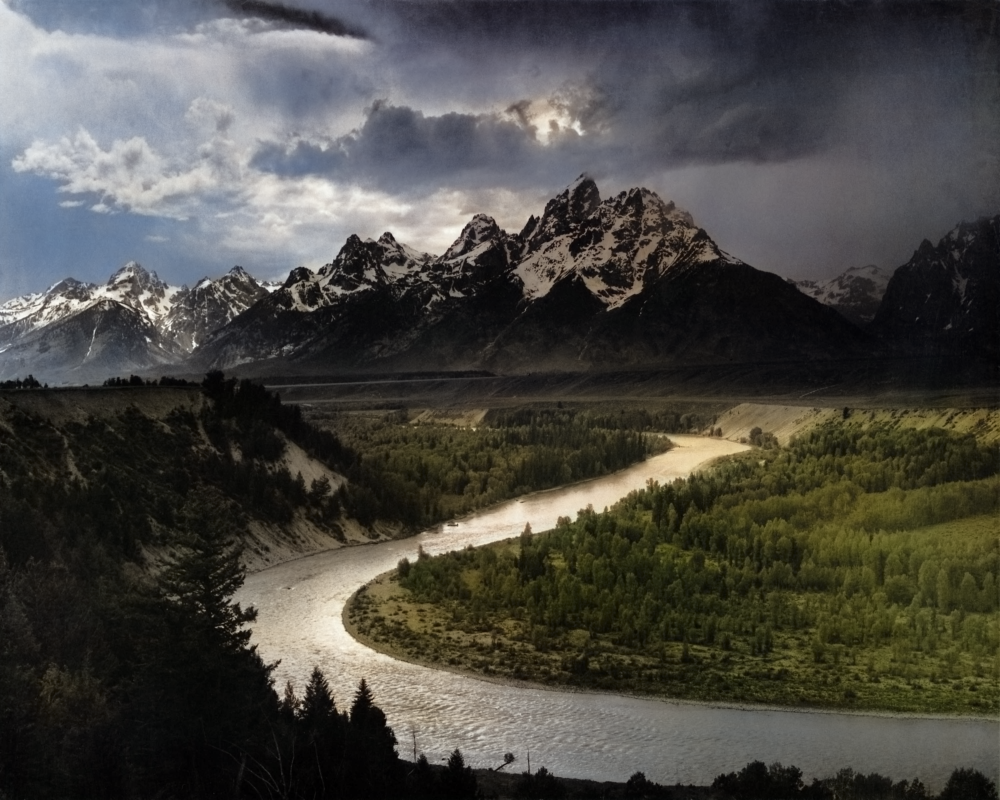

In [26]:
# colorized_img
from torchvision import transforms

f = transforms.ToPILImage()

f(torch.from_numpy(norm_out_img).permute(2,0,1))#.view(3,-1,-1)

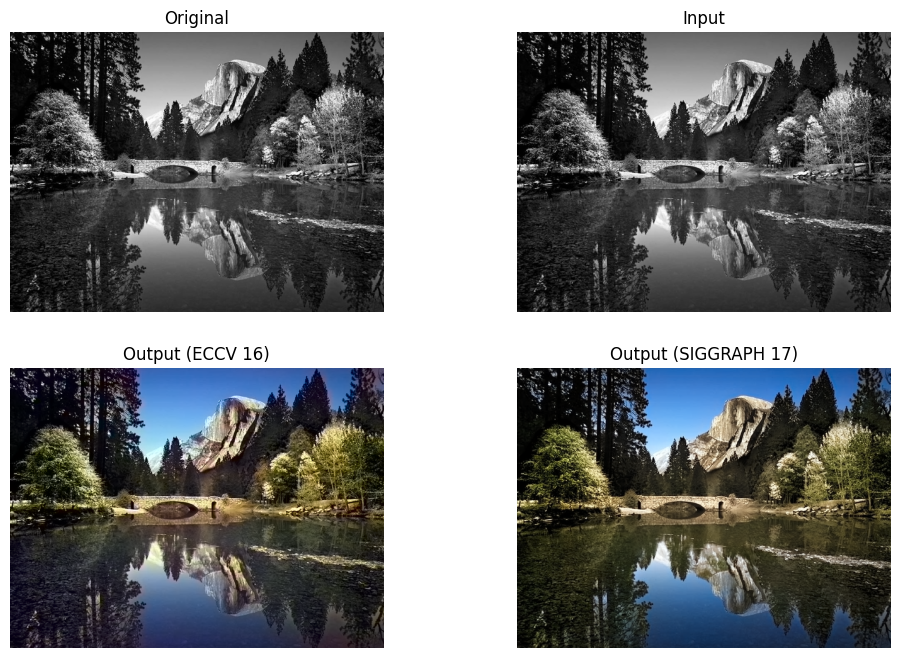

In [7]:
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(img_bw)
plt.title('Input')
plt.axis('off')

plt.subplot(2,2,3)
plt.imshow(out_img_eccv16)
plt.title('Output (ECCV 16)')
plt.axis('off')

plt.subplot(2,2,4)
plt.imshow(out_img_siggraph17)
plt.title('Output (SIGGRAPH 17)')
plt.axis('off')
plt.show()


In [9]:
out_img_eccv16.shape

(675, 900, 3)